<a href="https://colab.research.google.com/github/johnryantaylor/QCES/blob/main/Project3_tsunami.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project 3: Tsunami
In this project, we will use Dedalus to model the propagation of Tsunami waves. Tsunami typically have wavelengths larger than 100km and periods of about 1 hour. Since their wavelength is much larger than the depth of the ocean, Tsunami can be modelled using the shallow water equations. 

Here, we will use Dedalus to solve an initial value problem for the shallow water equations. We will generate a Tsunami using a localized disturbance to the water height. 

Student tasks are in [Section 1.3]( #section1pt3 ), [Section 2.3]( #section2pt3 ), and [Section 3.3]( #section3pt3 ).

## Setup
If you are using Google colab, run the script below to install Dedalus

In [1]:
# Set environment variables for best performance
%env OMP_NUM_THREADS=1
%env NUMEXPR_MAX_THREADS=1

# Minimize logging output
import logging
logging.disable(logging.DEBUG)

# Check if running on google colab
import os
using_google_colab = bool(os.getenv("COLAB_RELEASE_TAG"))

# Check for Dedalus
try:
    import dedalus.public as de
    print("Dedalus already installed :)")
except:
    print("Dedalus not installed yet.")
    if using_google_colab:
        print("Installing for Google Colab.")
        print()
        # Step 1: Install FFTW
        !apt-get install libfftw3-dev
        !apt-get install libfftw3-mpi-dev
        # Step 2: Set paths for Dedalus installation
        import os
        os.environ['MPI_INCLUDE_PATH'] = "/usr/lib/x86_64-linux-gnu/openmpi/include"
        os.environ['MPI_LIBRARY_PATH'] = "/usr/lib/x86_64-linux-gnu"
        os.environ['FFTW_INCLUDE_PATH'] = "/usr/include"
        os.environ['FFTW_LIBRARY_PATH'] = "/usr/lib/x86_64-linux-gnu"
        # Step 3: Install Dedalus using pip
        !pip3 install cython "mpi4py<4.0" numpy setuptools wheel
        !CC=mpicc pip3 install --no-cache --no-build-isolation http://github.com/dedalusproject/dedalus/zipball/master/
        !pip3 install -q ipympl
        # Step 4: Check installation
        print()
        try:
            import dedalus.public as de
            print("Dedalus successfully installed :)")
        except:
            print("Error installing Dedalus :(")
            raise
    else:
        print("See website for installation instructions:")
        print("https://dedalus-project.readthedocs.io/en/latest/pages/installation.html")

# Setup interactive matplotlib
if using_google_colab:
    from google.colab import output
    output.enable_custom_widget_manager()

env: OMP_NUM_THREADS=1
env: NUMEXPR_MAX_THREADS=1
Dedalus already installed :)


## 1.  1D shallow water equations
Let's start by solving the shallow water equations in 1D with periodic boundary conditions in our spatial variable, $x$. The script below solves the following equations:

$$ \partial_t u + g \partial_x(h) = - u\partial_x u$$
$$ \partial_t h + \partial_x(Hu) = -\partial_x(hu)$$

In these equations, $g$ is the constant gravitational acceleration, $u$ is the velocity in the $x$ direction, $H$ is the resting height, and $h$ is the height of the free surface relative to $H$. Note that the terms on the right hand side are nonlinear in our dependent variables, and we will use an explicit timestepping method for these terms. Recall that Dedalus uses explicit timestepping for terms on the right hand side of the inputted equation.

Because we are interested in an application to Tsunami, we will solve the equations using dimensional variables. It is convenient to define simulation units at the start of the script so that we can be explicit about the units.

We will start with the following initial conditions:
$$ h=e^{-(x-x_1)^2/w_1^2} $$
$$ u=(c/g)h$$
where $x_1$ is the center and $w_1=100$ km is the width of the Gaussian perturbation. This generates a wave that will propagate to the right with speed $c$ before it encounters the seamount.

To see how the waves change as they approach shallow water, we will set the resting water depth to include a localized seamount using the form:
$$ H=H_0-(H_0-H_{min})e^{(-(x-x_2)^2/w_2^2)} $$
where $x_2$ is the location of the seamount, $H_0=4$ km is the depth of the ocean away from the seamount, and $H_{min}$ is the minimum water depth above the seamount. Note that since $H\ll w$, the shallow water approximation is appropriate here.

### 1.1  Dedalus script to solve the 1D shallow water equations

The script below solves the 1D shallow water equations with the initial conditions given above.

In [2]:
# Import the required packages
import numpy as np
import dedalus.public as dedalus
import logging
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)

# Define the simulation units. This is optional, but will help us keep track of units
meter = 1
kilometer = meter * 1e3
second = 1
minute = 60
hour = 3600
day = hour * 24

# Specify the simulation parameters
Lx = 1000 * kilometer # The domain size
Nx = 512 # The number of gridpoints in x
g = 9.81 * meter / second**2 # Gravitational acceleration
H0 = 4 * kilometer # Reference ocean depth
w1 = 20 * kilometer # Width of the initial perturbation
x1 = 200 * kilometer # Center of the initial perturbation
x2 = 500 * kilometer # Center of the seamount
w2 = 100 * kilometer # Width of the seamount
H_min = 100 * meter # minimum depth above the seamount
c = np.sqrt(g*H0)

timestep = 60 * second # Specify the timestep
stop_sim_time = 100 * minute # Specify the stopping time

timestepper = dedalus.RK222
max_timestep = 0.125

# Create an x-coordinate, a corresponding basis, and a distributor
xcoord = dedalus.Coordinate('x')
dist = dedalus.Distributor(xcoord, dtype=np.float64) # No mesh for serial / automatic parallelization
x_basis = dedalus.RealFourier(xcoord, size=Nx, bounds=(0, Lx))
x = dist.local_grid(x_basis)

# Specify the Fields and set the initial conditions
u = dist.Field(name='u', bases=x_basis)
h = dist.Field(name='h', bases=x_basis)
H = dist.Field(name='H', bases=x_basis)
h.change_scales(1) 
H.change_scales(1) 
u.change_scales(1)
H['g'] = H0-(H0-H_min)*np.exp(-(x-x2)**2.0/w2**2.0)
h['g'] = np.exp(-(x-x1)**2.0/w1**2.0)  # Initialize the height with a Gaussian function with width set above
u['g'] = (g/c)*h['g']

# Operators
dx = lambda a: dedalus.Differentiate(a, xcoord)

# Problem
problem = dedalus.IVP([u, h], namespace=locals())
problem.add_equation("dt(u) + g*dx(h) = - u*dx(u)")
problem.add_equation("dt(h) + dx(H*u) = - dx(h*u)")

# Solver
solver = problem.build_solver(dedalus.RK222)
solver.stop_sim_time = stop_sim_time

# Analysis
snapshots = solver.evaluator.add_file_handler('snapshots', sim_dt=1*hour, max_writes=10)
snapshots.add_task(h, name='h')
snapshots.add_task(u, name='u')

h.change_scales(1)
h_save = [np.copy(h['g'])]; t_save = [solver.sim_time]; # Save the initial condition and the initial time
# Main loop
try:
    logger.info('Starting main loop')
    while solver.proceed:
        solver.step(timestep)
        if (solver.iteration-1) % 1 == 0:
            h.change_scales(1)
            h_save.append(np.copy(h['g']))
            t_save.append(solver.sim_time)
except:
    logger.error('Exception raised, triggering end of main loop.')
    raise
finally:
    solver.log_stats()

h_save=np.array(h_save) # convert h_save to an np.array type to allow data slicing

2025-11-26 14:51:21,263 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 4.9e+01/s
2025-11-26 14:51:21,267 __main__ 0/1 INFO :: Starting main loop
2025-11-26 14:51:21,324 solvers 0/1 INFO :: Simulation stop time reached.
2025-11-26 14:51:21,325 solvers 0/1 INFO :: Final iteration: 100
2025-11-26 14:51:21,325 solvers 0/1 INFO :: Final sim time: 6000.0
2025-11-26 14:51:21,325 solvers 0/1 INFO :: Setup time (init - iter 0): 0.3586 sec
2025-11-26 14:51:21,325 solvers 0/1 INFO :: Warmup time (iter 0-10): 0.01868 sec
2025-11-26 14:51:21,326 solvers 0/1 INFO :: Run time (iter 10-end): 0.03898 sec
2025-11-26 14:51:21,326 solvers 0/1 INFO :: CPU time (iter 10-end): 1.083e-05 cpu-hr
2025-11-26 14:51:21,326 solvers 0/1 INFO :: Speed: 4.719e+06 mode-stages/cpu-sec


### 1.2  Plotting
The code below will make a movie of the height.

2025-11-26 14:51:21,366 matplotlib.animation 0/1 INFO :: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2025-11-26 14:51:21,367 matplotlib.animation 0/1 INFO :: MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1200x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /var/folders/rp/zp_9g6fs2nz5lbnfxvt4jm0c0000gn/T/tmpflnhiscn/temp.m4v


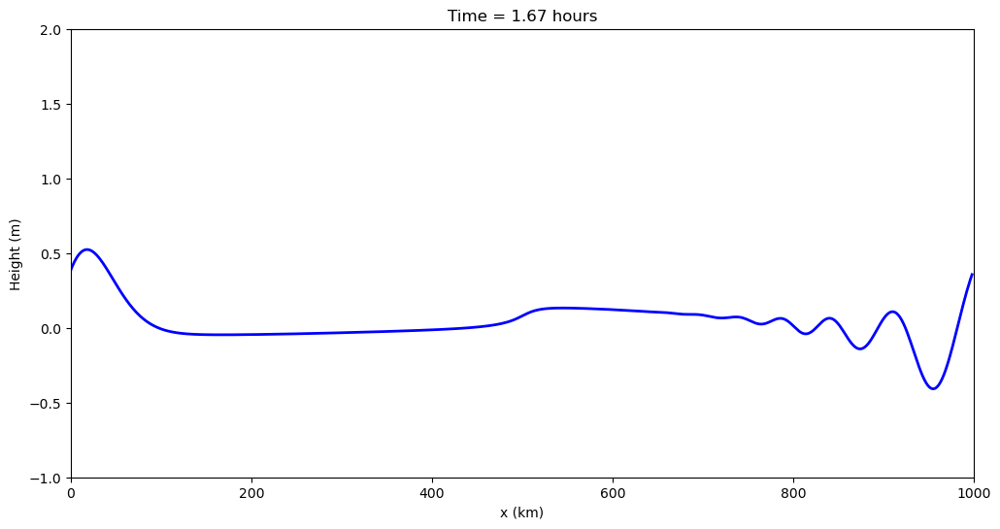

In [3]:
# create a figure and axes
fig = plt.figure(figsize=(12,6))

# Specify the axis limits and labels
plt.xlim((0, Lx / (1*kilometer)))            
plt.ylim((-1, 2))
plt.xlabel('x (km)')
plt.ylabel('Height (m)')

# Create objects that will change during the animation
txt_title = plt.title('')
height, = plt.plot([], [], 'b', lw=2)    

# Define an animation function
def drawframe(n):
    height.set_data(x/(1*kilometer), h_save[n,:])
    txt_title.set_text('Time = {0:.2f} hours'.format(t_save[n]/(1*hour)))
    return (height,)

from matplotlib import animation
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, drawframe, frames=len(t_save), interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())


### 1.3 Student investigation
<a id='section1pt3'></a>
In the cells below, provide an expression for the expected wave speed and state any assumptions that are necessary to arrive at this. Then plot the wave speed from the output above and compare this with the expected value. 

*Providing an expression for the expected wave speed*

We consider the amplitude of the velocity and the deviations to the surface height (h) to be small enough such that terms that involve the non-linear products involving $u$ and $h$ can be neglected. Thus, we have the following governing equations:

$\begin{equation}
\frac{\partial u}{\partial t} + g \frac{\partial h}{\partial x} = 0
\end{equation}$
$\begin{equation}
\frac{\partial h}{\partial t} + \frac{\partial (Hu)}{\partial x} = 0
\end{equation}$

Let us take the derivative with respect to time of equation (1):

$\begin{equation}
\frac{\partial^2 u}{\partial t^2} + g \frac{\partial^2 h}{\partial t \partial x} = 0.
\end{equation}$

Let us now take the derivative with respect to $x$ of equation (2) in order to provide a substitution:

$\begin{equation}
\frac{\partial^2 h}{\partial x \partial t} + \frac{\partial^2 (Hu)}{\partial x^2} = 0.
\end{equation}$

Note that $\frac{\partial^2 h}{\partial t \partial x}$ and $\frac{\partial^2 h}{\partial x \partial t}$ are equivalent as long as $h$ is $C^2$ differentiable which for most real systems is true. Hence, equation (3) becomes:

$\begin{equation}
\frac{\partial^2 u}{\partial t^2} - g  \frac{\partial^2 (Hu)}{\partial x^2} = 0
\end{equation}
$

Simplifying this, we have:

$$\frac{\partial^2 u}{\partial t^2} - g  \left(u(x) \frac{\partial^2 H}{\partial x^2} + 2 \frac{\partial h_b}{\partial x}\frac{\partial u}{\partial x} + H(x) \frac{\partial^2 u}{\partial x^2}\right) = 0$$

Let $H = H_0 - h_b(x,y).$ Then the above becomes: 

$$\frac{\partial^2 u}{\partial t^2} - g  \left(-u(x) \frac{\partial^2 h_b}{\partial x^2} - 2 \frac{\partial H}{\partial x}\frac{\partial u}{\partial x} + (H_0 - h_b) \frac{\partial^2 u}{\partial x^2}\right) = 0$$

If we assume that $\frac{\partial h_b}{\partial x}$ scales with $\frac{H_0 - H_{min}}{L_b}$ (where $H_{min} = min(H)$) and $\frac{\partial u}{\partial x}$ scales with $\frac{U}{L_w},$ then since $L_w << L_b$ we can then we can simplify the approximation by removing the terms with partials in $h_b.$ Hence,

$
\begin{equation}
\frac{\partial^2 u}{\partial t^2} - g  \left(H(x) \frac{\partial^2 u}{\partial x^2}\right) \approx 0
\end{equation}
$

Note that because $H$ is a function of $x$ and not constant, we do not arrive at the wave equation. However, we can get the *local* speed evaluated at a specific $x$ if we have:

$$c(x) \approx \sqrt{gH(x)}$$

*Plotting the expected wave speed as a function of x*

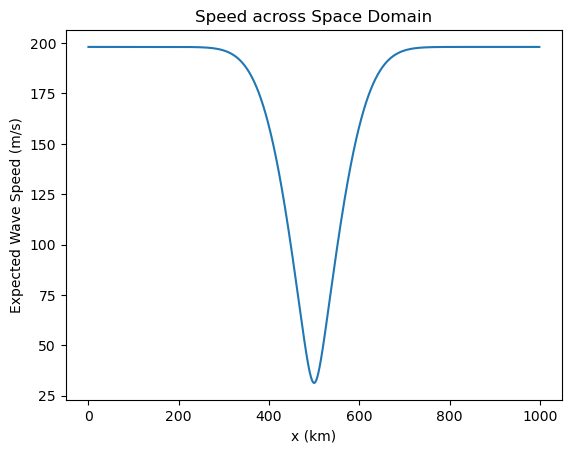

In [4]:
# CREATE FIGURES HERE
x_linspace = range(1000)

speed = []
for i in x_linspace:
    big_H = H0-(H0-H_min)*np.exp(-(i * 1000-x2)**2.0/w2**2.0)
    speed.append(np.sqrt(9.81 * big_H))

plt.xlabel("x (km)")
plt.ylabel("Expected Wave Speed (m/s)")
plt.title("Speed across Space Domain")
plt.plot(x_linspace, speed)


*Plotting the wavespeed from the output above*

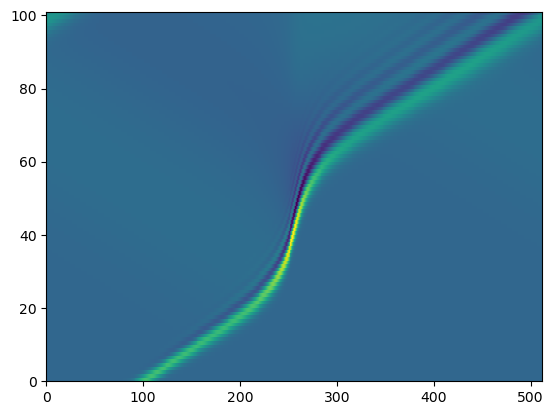

In [5]:
plt.pcolormesh(h_save)

Times (s): [0.0, 60.0, 120.0, 180.0, 240.0, 300.0, 360.0, 420.0, 480.0, 540.0, 600.0, 660.0, 720.0, 780.0, 840.0, 900.0, 960.0, 1020.0, 1080.0, 1140.0, 1200.0, 1260.0, 1320.0, 1380.0, 1440.0, 1500.0, 1560.0, 1620.0, 1680.0, 1740.0, 1800.0, 1860.0, 1920.0, 1980.0, 2040.0, 2100.0, 2160.0, 2220.0, 2280.0, 2340.0, 2400.0, 2460.0, 2520.0, 2580.0, 2640.0, 2700.0, 2760.0, 2820.0, 2880.0, 2940.0, 3000.0, 3060.0, 3120.0, 3180.0, 3240.0, 3300.0, 3360.0, 3420.0, 3480.0, 3540.0, 3600.0, 3660.0, 3720.0, 3780.0, 3840.0, 3900.0, 3960.0, 4020.0, 4080.0, 4140.0, 4200.0, 4260.0, 4320.0, 4380.0, 4440.0, 4500.0, 4560.0, 4620.0, 4680.0, 4740.0, 4800.0, 4860.0, 4920.0, 4980.0, 5040.0, 5100.0, 5160.0, 5220.0, 5280.0, 5340.0, 5400.0, 5460.0, 5520.0, 5580.0, 5640.0, 5700.0, 5760.0, 5820.0, 5880.0, 5940.0, 6000.0]
Speeds (m/s): [195.3125, 195.3125, 162.76041666666666, 195.3125, 195.3125, 195.3125, 162.76041666666666, 195.3125, 195.3125, 195.3125, 195.3125, 162.76041666666666, 195.3125, 195.3125, 162.76041666666

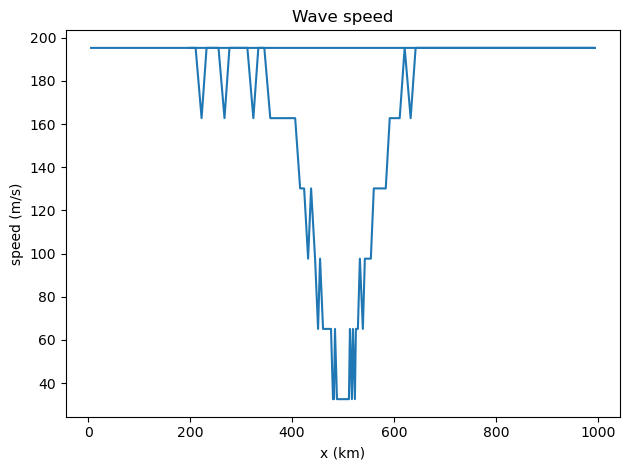

In [6]:
L_km = Lx / kilometer    
Nx_local = h_save.shape[1]

x_values = []      # positions in km
time_values = []   # seconds
for n in range(len(h_save[:, 0])):
    idx = int(np.argmax(h_save[n, :]))          
    x_values.append(idx / Nx_local * L_km)      
    time_values.append(t_save[n])               

speed_as_function_of_x = []  # m/s
for i in range(len(x_values) - 1):
    dx_km = ((x_values[i+1] - x_values[i] + L_km/2) % L_km) - L_km/2
    dt_s = (time_values[i+1] - time_values[i])  # seconds
    speed_as_function_of_x.append((dx_km * 1000.0) / dt_s)  # m/s

# Quick look / plot
print("Times (s):", time_values)
print("Speeds (m/s):", speed_as_function_of_x)

plt.figure()
plt.plot(x_values[:-1], speed_as_function_of_x)
plt.xlabel('x (km)')
plt.ylabel('speed (m/s)')
plt.title('Wave speed')
plt.tight_layout()

*Plotting both on the same plot*

Times (s): [0.0, 60.0, 120.0, 180.0, 240.0, 300.0, 360.0, 420.0, 480.0, 540.0, 600.0, 660.0, 720.0, 780.0, 840.0, 900.0, 960.0, 1020.0, 1080.0, 1140.0, 1200.0, 1260.0, 1320.0, 1380.0, 1440.0, 1500.0, 1560.0, 1620.0, 1680.0, 1740.0, 1800.0, 1860.0, 1920.0, 1980.0, 2040.0, 2100.0, 2160.0, 2220.0, 2280.0, 2340.0, 2400.0, 2460.0, 2520.0, 2580.0, 2640.0, 2700.0, 2760.0, 2820.0, 2880.0, 2940.0, 3000.0, 3060.0, 3120.0, 3180.0, 3240.0, 3300.0, 3360.0, 3420.0, 3480.0, 3540.0, 3600.0, 3660.0, 3720.0, 3780.0, 3840.0, 3900.0, 3960.0, 4020.0, 4080.0, 4140.0, 4200.0, 4260.0, 4320.0, 4380.0, 4440.0, 4500.0, 4560.0, 4620.0, 4680.0, 4740.0, 4800.0, 4860.0, 4920.0, 4980.0, 5040.0, 5100.0, 5160.0, 5220.0, 5280.0, 5340.0, 5400.0, 5460.0, 5520.0, 5580.0, 5640.0, 5700.0, 5760.0, 5820.0, 5880.0, 5940.0, 6000.0]
Speeds (m/s): [195.3125, 195.3125, 162.76041666666666, 195.3125, 195.3125, 195.3125, 162.76041666666666, 195.3125, 195.3125, 195.3125, 195.3125, 162.76041666666666, 195.3125, 195.3125, 162.76041666666

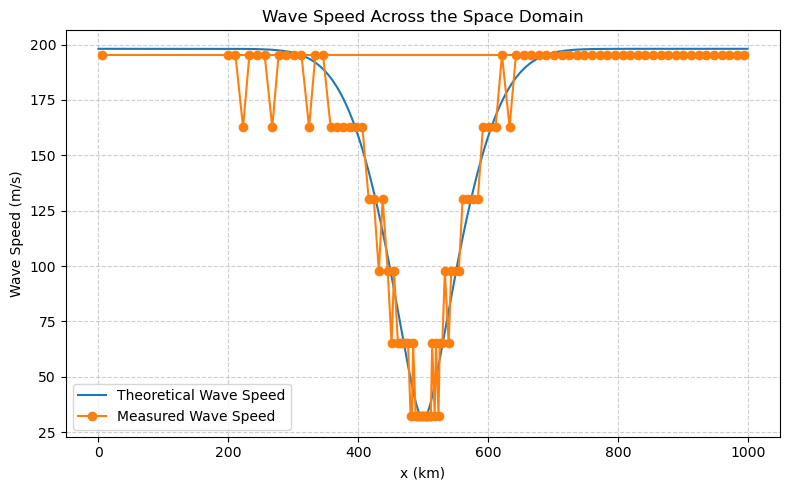

In [7]:

x_linspace = np.arange(1000)  
speed_theoretical = []
for i in x_linspace:
    big_H = H0 - (H0 - H_min) * np.exp(-((i * 1000 - x2) ** 2.0) / w2 ** 2.0)
    speed_theoretical.append(np.sqrt(9.81 * big_H))

L_km = Lx / kilometer    
Nx_local = h_save.shape[1]

x_values = []      # positions in km
time_values = []   # seconds
for n in range(len(h_save[:, 0])):
    idx = int(np.argmax(h_save[n, :]))          
    x_values.append(idx / Nx_local * L_km)      
    time_values.append(t_save[n])               

speed_as_function_of_x = []  # m/s
for i in range(len(x_values) - 1):
    dx_km = ((x_values[i+1] - x_values[i] + L_km/2) % L_km) - L_km/2
    dt_s = (time_values[i+1] - time_values[i])  # seconds
    speed_as_function_of_x.append((dx_km * 1000.0) / dt_s)  # m/s

print("Times (s):", time_values)
print("Speeds (m/s):", speed_as_function_of_x)
plt.figure(figsize=(8, 5))
plt.plot(x_linspace, speed_theoretical, label='Theoretical Wave Speed', color='tab:blue')
plt.plot(x_values[:-1], speed_as_function_of_x, 'o-', label='Measured Wave Speed', color='tab:orange')

plt.xlabel('x (km)')
plt.ylabel('Wave Speed (m/s)')
plt.title('Wave Speed Across the Space Domain')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

**ANSWER:** We can see from the above plot that the plots are similar, but not exact. The steps that are evident in the measured wave speed graph come from the discretization in the space domain. In the above case, we have 512 units in the space domain which means that the wave will appear to travel to the nearest unit. With more discretization, the smaller the jumps in wave speed will be (see graphs below). This discretization also results in the odd "jumps" that occur in the tail ends of the graph. 

In [8]:
# Import the required packages
import numpy as np
import dedalus.public as dedalus
import logging
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)

# Define the simulation units. This is optional, but will help us keep track of units
meter = 1
kilometer = meter * 1e3
second = 1
minute = 60
hour = 3600
day = hour * 24

# Specify the simulation parameters
Lx = 1000 * kilometer # The domain size
Nx = 2048 # The number of gridpoints in x
g = 9.81 * meter / second**2 # Gravitational acceleration
H0 = 4 * kilometer # Reference ocean depth
w1 = 20 * kilometer # Width of the initial perturbation
x1 = 200 * kilometer # Center of the initial perturbation
x2 = 500 * kilometer # Center of the seamount
w2 = 100 * kilometer # Width of the seamount
H_min = 100 * meter # minimum depth above the seamount
c = np.sqrt(g*H0)

timestep = 60 * second # Specify the timestep
stop_sim_time = 100 * minute # Specify the stopping time

timestepper = dedalus.RK222
max_timestep = 0.125

# Create an x-coordinate, a corresponding basis, and a distributor
xcoord = dedalus.Coordinate('x')
dist = dedalus.Distributor(xcoord, dtype=np.float64) # No mesh for serial / automatic parallelization
x_basis = dedalus.RealFourier(xcoord, size=Nx, bounds=(0, Lx))
x = dist.local_grid(x_basis)

# Specify the Fields and set the initial conditions
u = dist.Field(name='u', bases=x_basis)
h = dist.Field(name='h', bases=x_basis)
H = dist.Field(name='H', bases=x_basis)
h.change_scales(1) 
H.change_scales(1) 
u.change_scales(1)
H['g'] = H0-(H0-H_min)*np.exp(-(x-x2)**2.0/w2**2.0)
h['g'] = np.exp(-(x-x1)**2.0/w1**2.0)  # Initialize the height with a Gaussian function with width set above
u['g'] = (g/c)*h['g']

# Operators
dx = lambda a: dedalus.Differentiate(a, xcoord)

# Problem
problem = dedalus.IVP([u, h], namespace=locals())
problem.add_equation("dt(u) + g*dx(h) = - u*dx(u)")
problem.add_equation("dt(h) + dx(H*u) = - dx(h*u)")

# Solver
solver = problem.build_solver(dedalus.RK222)
solver.stop_sim_time = stop_sim_time

# Analysis
snapshots = solver.evaluator.add_file_handler('snapshots', sim_dt=1*hour, max_writes=10)
snapshots.add_task(h, name='h')
snapshots.add_task(u, name='u')

h.change_scales(1)
h_save = [np.copy(h['g'])]; t_save = [solver.sim_time]; # Save the initial condition and the initial time
# Main loop
try:
    logger.info('Starting main loop')
    while solver.proceed:
        solver.step(timestep)
        if (solver.iteration-1) % 1 == 0:
            h.change_scales(1)
            h_save.append(np.copy(h['g']))
            t_save.append(solver.sim_time)
except:
    logger.error('Exception raised, triggering end of main loop.')
    raise
finally:
    solver.log_stats()

h_save=np.array(h_save) # convert h_save to an np.array type to allow data slicing

2025-11-26 14:51:24,931 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 1.9e+01/s
2025-11-26 14:51:24,932 __main__ 0/1 INFO :: Starting main loop
2025-11-26 14:51:25,018 solvers 0/1 INFO :: Simulation stop time reached.
2025-11-26 14:51:25,019 solvers 0/1 INFO :: Final iteration: 100
2025-11-26 14:51:25,019 solvers 0/1 INFO :: Final sim time: 6000.0
2025-11-26 14:51:25,019 solvers 0/1 INFO :: Setup time (init - iter 0): 0.7108 sec
2025-11-26 14:51:25,019 solvers 0/1 INFO :: Warmup time (iter 0-10): 0.02596 sec
2025-11-26 14:51:25,020 solvers 0/1 INFO :: Run time (iter 10-end): 0.06001 sec
2025-11-26 14:51:25,020 solvers 0/1 INFO :: CPU time (iter 10-end): 1.667e-05 cpu-hr
2025-11-26 14:51:25,020 solvers 0/1 INFO :: Speed: 1.228e+07 mode-stages/cpu-sec


Times (s): [0.0, 60.0, 120.0, 180.0, 240.0, 300.0, 360.0, 420.0, 480.0, 540.0, 600.0, 660.0, 720.0, 780.0, 840.0, 900.0, 960.0, 1020.0, 1080.0, 1140.0, 1200.0, 1260.0, 1320.0, 1380.0, 1440.0, 1500.0, 1560.0, 1620.0, 1680.0, 1740.0, 1800.0, 1860.0, 1920.0, 1980.0, 2040.0, 2100.0, 2160.0, 2220.0, 2280.0, 2340.0, 2400.0, 2460.0, 2520.0, 2580.0, 2640.0, 2700.0, 2760.0, 2820.0, 2880.0, 2940.0, 3000.0, 3060.0, 3120.0, 3180.0, 3240.0, 3300.0, 3360.0, 3420.0, 3480.0, 3540.0, 3600.0, 3660.0, 3720.0, 3780.0, 3840.0, 3900.0, 3960.0, 4020.0, 4080.0, 4140.0, 4200.0, 4260.0, 4320.0, 4380.0, 4440.0, 4500.0, 4560.0, 4620.0, 4680.0, 4740.0, 4800.0, 4860.0, 4920.0, 4980.0, 5040.0, 5100.0, 5160.0, 5220.0, 5280.0, 5340.0, 5400.0, 5460.0, 5520.0, 5580.0, 5640.0, 5700.0, 5760.0, 5820.0, 5880.0, 5940.0, 6000.0]
Speeds (m/s): [179.03645833333334, 187.17447916666666, 187.17447916666666, 187.17447916666666, 187.17447916666666, 187.17447916666666, 187.17447916666666, 187.17447916666666, 187.17447916666666, 187.1

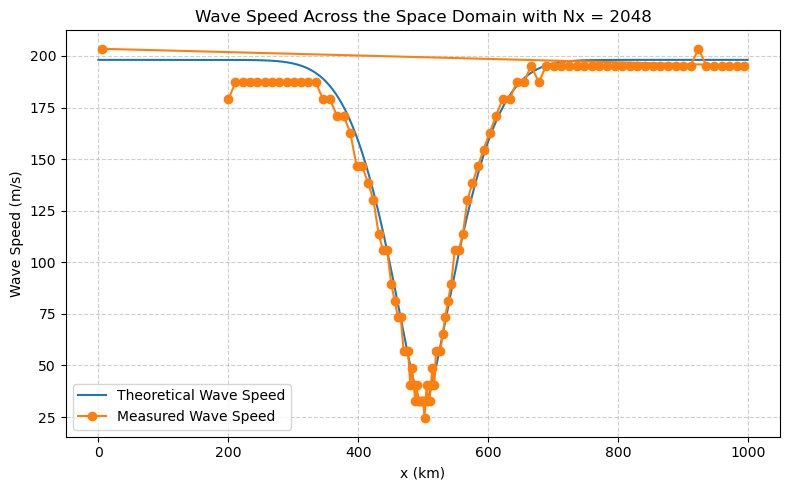

In [9]:
x_linspace = np.arange(1000)  
speed_theoretical = []
for i in x_linspace:
    big_H = H0 - (H0 - H_min) * np.exp(-((i * 1000 - x2) ** 2.0) / w2 ** 2.0)
    speed_theoretical.append(np.sqrt(9.81 * big_H))

L_km = Lx / kilometer    
Nx_local = h_save.shape[1]

x_values = []      # positions in km
time_values = []   # seconds
for n in range(len(h_save[:, 0])):
    idx = int(np.argmax(h_save[n, :]))          
    x_values.append(idx / Nx_local * L_km)      
    time_values.append(t_save[n])               

speed_as_function_of_x = []  # m/s
for i in range(len(x_values) - 1):
    dx_km = ((x_values[i+1] - x_values[i] + L_km/2) % L_km) - L_km/2
    dt_s = (time_values[i+1] - time_values[i])  # seconds
    speed_as_function_of_x.append((dx_km * 1000.0) / dt_s)  # m/s

print("Times (s):", time_values)
print("Speeds (m/s):", speed_as_function_of_x)
plt.figure(figsize=(8, 5))
plt.plot(x_linspace, speed_theoretical, label='Theoretical Wave Speed', color='tab:blue')
plt.plot(x_values[:-1], speed_as_function_of_x, 'o-', label='Measured Wave Speed', color='tab:orange')

plt.xlabel('x (km)')
plt.ylabel('Wave Speed (m/s)')
plt.title('Wave Speed Across the Space Domain with Nx = 2048')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

## 2.  2D Shallow water equations

Now, let's see how things change if we move to two dimensions. The script below solves the 2D shallow water equations:

$$ \partial_t u + g \partial_x(h) = - u*\partial_x u - v*\partial_y u$$
$$ \partial_t v + g \partial_y(h) = - u*\partial_x v - v*\partial_y v$$
$$ \partial_t h + \partial_x(u*H) + \partial_y(v*H)) = -\partial_x(h*u) - \partial_y(h*v)$$

We will initilize the Tsunami with the following equation 
$$ h=e^{-x^2/w_1^2} $$
$$ u=(g/c)*h $$

where $c=\sqrt{gH_0}$ and $H_0$ is the constant reference depth. The relationship between $u$ and $h$ follows from linearized shallow water equations and corresponds to a wave propagating in the $+x$ direction with a speed $c$.

We will solve the equations in a square domain with periodic boundary conditions and a Gaussian seamount in the middle of the domain with total undisturbed fluid height

$$ H=H_0 - (H_0 - H_{min})e^{-(x^2+y^2)/w_2^2} $$

The Tsunami should propagate with speed $c$ over the deep ocean where the depth is constant, but the wave will be modified as it passes over the seamount.

### 2.1  Dedalus script to solve the 2D shallow water equations

In [10]:
# Import the required packages
import numpy as np
import dedalus.public as dedalus
import logging
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)

# Define the simulation units. This is optional, but will help us keep track of units
meter = 1
kilometer = meter * 1e3
second = 1
minute = 60
hour = 3600
day = hour * 24

# Specify the simulation parameters
Lx = 1000 * kilometer # The domain size in x
Ly = 1000 * kilometer # The domain size in y
Nx = 64 # The number of gridpoints in x
Ny = 64 # The number of gridpoints in y
g = 9.81 * meter / second**2 # Gravitational acceleration
H0 = 4 * kilometer # Reference ocean depth
c = np.sqrt(g*H0) # Wave speed over the deep ocean
H_min = 1 * kilometer # minimum depth above the seamount
w1 = 50 * kilometer # Set the width of the wave
w2 = 200 * kilometer # Width of the seamount
x1 = -300 * kilometer # Center of the wave at t=0

timestep = 60 * second # Specify the timestep
stop_sim_time = 60 * minute # Specify the stopping time

timestepper = dedalus.RK222
max_timestep = 0.125

# Bases
coords = dedalus.CartesianCoordinates('x', 'y')
dist = dedalus.Distributor(coords, dtype=np.float64)
xbasis = dedalus.RealFourier(coords['x'], size=Nx, bounds=(-Lx/2, Lx/2), dealias=3/2)
ybasis = dedalus.RealFourier(coords['y'], size=Ny, bounds=(-Ly/2, Ly/2), dealias=3/2)

x, y = dist.local_grids(xbasis, ybasis)

# Fields
u = dist.Field(name='u', bases=(xbasis, ybasis))
v = dist.Field(name='v', bases=(xbasis, ybasis))
h = dist.Field(name='h', bases=(xbasis, ybasis))
H = dist.Field(name='H', bases=(xbasis, ybasis))

# Initial conditions
H.change_scales(1)
h.change_scales(1) # Set values on regular grid
u.change_scales(1)
v.change_scales(1)
H['g'] = H0-(H0-H_min)*np.exp(-x**2.0/w2**2.0 - y**2.0/w2**2.0)
h['g'] = np.exp(-(x-x1)**2/w1**2)  # Initialize the dependent variable c with a Gaussian function (note ** is the exponentiation operator)
u['g'] = (g/c)*h['g']
v['g'] = 0

# Operators
dx = lambda a: dedalus.Differentiate(a, coords['x'])
dy = lambda a: dedalus.Differentiate(a, coords['y'])

# Problem
problem = dedalus.IVP([u, v, h], namespace=locals())
problem.add_equation("dt(u) + g*dx(h) = - u*dx(u) - v*dy(u)")
problem.add_equation("dt(v) + g*dy(h) = - u*dx(v) - v*dy(v)")
problem.add_equation("dt(h) + (dx(H*u) + dy(H*v)) = - dx(h*u) - dy(h*v)")

# Solver
solver = problem.build_solver(dedalus.RK222)
solver.stop_sim_time = stop_sim_time

# Analysis
snapshots = solver.evaluator.add_file_handler('snapshots', sim_dt=1*hour, max_writes=10)
snapshots.add_task(h, name='h')
snapshots.add_task(u, name='u')
snapshots.add_task(v, name='v')

h.change_scales(1)
h_save = [np.copy(h['g'])]; t_save = [solver.sim_time]; # Save the initial condition and the initial time
# Main loop
try:
    logger.info('Starting main loop')
    while solver.proceed:
        solver.step(timestep)
        if (solver.iteration-1) % 1 == 0:
            h.change_scales(1)
            h_save.append(np.copy(h['g']))
            t_save.append(solver.sim_time)
except:
    logger.error('Exception raised, triggering end of main loop.')
    raise
finally:
    solver.log_stats()

h_save=np.array(h_save) # convert h_save to an np.array type to allow data slicing

2025-11-26 14:51:36,030 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 11s, Remaining: 0s, Rate: 9.2e-02/s
2025-11-26 14:51:36,033 __main__ 0/1 INFO :: Starting main loop
2025-11-26 14:51:39,807 solvers 0/1 INFO :: Simulation stop time reached.
2025-11-26 14:51:39,807 solvers 0/1 INFO :: Final iteration: 60
2025-11-26 14:51:39,808 solvers 0/1 INFO :: Final sim time: 3600.0
2025-11-26 14:51:39,808 solvers 0/1 INFO :: Setup time (init - iter 0): 10.92 sec
2025-11-26 14:51:39,808 solvers 0/1 INFO :: Warmup time (iter 0-10): 2.431 sec
2025-11-26 14:51:39,808 solvers 0/1 INFO :: Run time (iter 10-end): 1.344 sec
2025-11-26 14:51:39,809 solvers 0/1 INFO :: CPU time (iter 10-end): 0.0003733 cpu-hr
2025-11-26 14:51:39,809 solvers 0/1 INFO :: Speed: 8.86e+05 mode-stages/cpu-sec


### 2.2  Plotting
The code below will make a movie of the height as a function of x and y

2025-11-26 14:51:39,835 matplotlib.animation 0/1 INFO :: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2025-11-26 14:51:39,836 matplotlib.animation 0/1 INFO :: MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 600x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /var/folders/rp/zp_9g6fs2nz5lbnfxvt4jm0c0000gn/T/tmpap9_0_51/temp.m4v


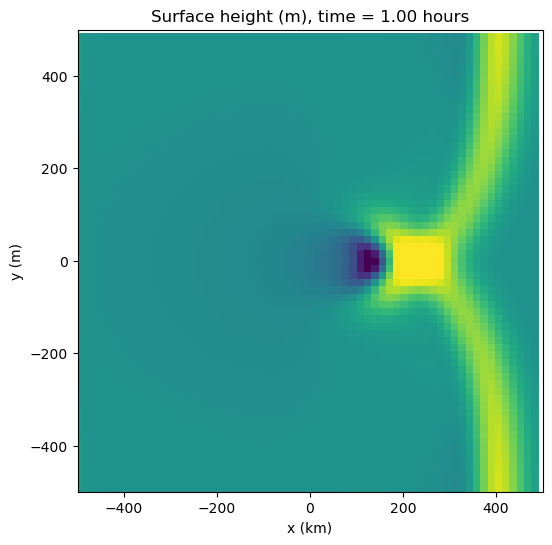

In [11]:
# create a figure and axes
fig = plt.figure(figsize=(6,6))

# Create arrays with the x and y coordinates for plotting using pcolor
from dedalus.extras import plot_tools
(X, Y) = plot_tools.quad_mesh(np.squeeze(x), np.squeeze(y))  

# Define an animation function
def drawframe(n):
    plt.clf # clear the figure before plotting the next frame
    height = plt.pcolor(X/(1*kilometer), Y/(1*kilometer), h_save[n,:,:].T, vmin=-1, vmax=1)
    # Specify the axis limits and labels
    plt.xlim((-Lx/2 / (1*kilometer),Lx/2 / (1*kilometer)))   
    plt.ylim((-Ly/2 / (1*kilometer),Ly/2 / (1*kilometer)))            
    plt.xlabel('x (km)')
    plt.ylabel('y (m)')
    plt.title('Surface height (m), time = {0:.2f} hours'.format(t_save[n]/(1*hour)))
    return (height,)

from matplotlib import animation
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, drawframe, frames=len(t_save), interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())

### 2.3 Student investigation
<a id='section2pt3'></a>
Qualitatively describe the influence of the seamount and explain this behavior using the shallow water equations. You can assume that the wave amplitude and velocity are small in the shallow water equations.

**ANSWER:** We can visually observe that the wave over the seamount slows down faster than the waves at the tail ends. Because the tail ends have a larger depth, they continue at normal speed and this results in a "bend" of the wavecrest towards the seamount. We also see in the figure a larger wave amplitude in the part of the wave that passed over the seamount while there is a dip in surface height immediately following the area of increased amplitude. These qualitative observations match our expected theory. Following similar derivations and approximations from section 1, we know that the speed of the wave will be $c = \sqrt{gH(x,y)}.$ Hence, over the seamount, the speed of the wave will decrease. Because of the different speeds of different parts of the wavecrest, the wavecrest will bend towards areas where velocity decreased (i.e over the seamount). To explain the increased amplitude, we can simplify the third governing equation by accounting for a small wave amplitude and velocity:

$$\frac{\partial h}{\partial t} + \frac{\partial (uH)}{\partial x} + \frac{\partial (vH)}{\partial y} = 0.$$

Simplifying, we have

$$\frac{\partial h}{\partial t} + u\frac{\partial H}{\partial x} + H\frac{\partial u}{\partial x} + v\frac{\partial H}{\partial y} + H\frac{\partial v}{\partial y} = 0,$$
$$\frac{\partial h}{\partial t} + H(\frac{\partial u}{\partial x} + \frac{\partial v}{\partial y}) + u\frac{\partial H}{\partial x} + v\frac{\partial H}{\partial y} = 0.$$

We see that there are two components to consider. First, the change in mass flux ($\frac{\partial (uH)}{\partial x}$) will be negative because as the wave approaches the seamount and then be positive as it crosses the mount. Second, we know that $u\frac{\partial H}{\partial x}$ will be negative as it cross the hump. To balance out the above governing equation, it must be the case that $\frac{\partial h}{\partial t}$ is positive as it crosses the mount. This suggests an increase in the wave amplitude. On the way down, the mass flux increases and thus we have a sharp decrease in amplitude right behind the wave crest. In plain terms, the slowed-down velocity causes a build up of mass and thus a rise in the surface.

Try varying some parameters (e.g. the width and height of the wave and/or seamount) and comment on the results. When does the wave no longer obey the linear shallow water equations which are valid for small waves You don't need to do a comprehensive parameter space search, but you should run several simulations with one or two parameters varied.

In [12]:
# Import the required packages
import numpy as np
import dedalus.public as dedalus
import logging
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)

# Define the simulation units. This is optional, but will help us keep track of units
meter = 1
kilometer = meter * 1e3
second = 1
minute = 60
hour = 3600
day = hour * 24

# Specify the simulation parameters
Lx = 1000 * kilometer # The domain size in x
Ly = 1000 * kilometer # The domain size in y
Nx = 64 # The number of gridpoints in x
Ny = 64 # The number of gridpoints in y
g = 9.81 * meter / second**2 # Gravitational acceleration
H0 = 11 * kilometer # Reference ocean depth
c = np.sqrt(g*H0) # Wave speed over the deep ocean
H_min = 0.01 * kilometer # minimum depth above the seamount
w1 = 50 * kilometer # Set the width of the wave
w2 = 200 * kilometer # Width of the seamount
x1 = -300 * kilometer # Center of the wave at t=0

timestep = 60 * second # Specify the timestep
stop_sim_time = 60 * minute # Specify the stopping time

timestepper = dedalus.RK222
max_timestep = 0.125

# Bases
coords = dedalus.CartesianCoordinates('x', 'y')
dist = dedalus.Distributor(coords, dtype=np.float64)
xbasis = dedalus.RealFourier(coords['x'], size=Nx, bounds=(-Lx/2, Lx/2), dealias=3/2)
ybasis = dedalus.RealFourier(coords['y'], size=Ny, bounds=(-Ly/2, Ly/2), dealias=3/2)

x, y = dist.local_grids(xbasis, ybasis)

# Fields
u = dist.Field(name='u', bases=(xbasis, ybasis))
v = dist.Field(name='v', bases=(xbasis, ybasis))
h = dist.Field(name='h', bases=(xbasis, ybasis))
H = dist.Field(name='H', bases=(xbasis, ybasis))

# Initial conditions
H.change_scales(1)
h.change_scales(1) # Set values on regular grid
u.change_scales(1)
v.change_scales(1)
H['g'] = H0-(H0-H_min)*np.exp(-x**2.0/w2**2.0 - y**2.0/w2**2.0)
h['g'] = np.exp(-(x-x1)**2/w1**2)  # Initialize the dependent variable c with a Gaussian function (note ** is the exponentiation operator)
u['g'] = (g/c)*h['g']
v['g'] = 0

# Operators
dx = lambda a: dedalus.Differentiate(a, coords['x'])
dy = lambda a: dedalus.Differentiate(a, coords['y'])

# Problem
problem = dedalus.IVP([u, v, h], namespace=locals())
problem.add_equation("dt(u) + g*dx(h) = - u*dx(u) - v*dy(u)")
problem.add_equation("dt(v) + g*dy(h) = - u*dx(v) - v*dy(v)")
problem.add_equation("dt(h) + (dx(H*u) + dy(H*v)) = - dx(h*u) - dy(h*v)")

# Solver
solver = problem.build_solver(dedalus.RK222)
solver.stop_sim_time = stop_sim_time

# Analysis
snapshots = solver.evaluator.add_file_handler('snapshots', sim_dt=1*hour, max_writes=10)
snapshots.add_task(h, name='h')
snapshots.add_task(u, name='u')
snapshots.add_task(v, name='v')

h.change_scales(1)
h_save = [np.copy(h['g'])]; t_save = [solver.sim_time]; # Save the initial condition and the initial time
# Main loop
try:
    logger.info('Starting main loop')
    while solver.proceed:
        solver.step(timestep)
        if (solver.iteration-1) % 1 == 0:
            h.change_scales(1)
            h_save.append(np.copy(h['g']))
            t_save.append(solver.sim_time)
except:
    logger.error('Exception raised, triggering end of main loop.')
    raise
finally:
    solver.log_stats()

h_save=np.array(h_save) # convert h_save to an np.array type to allow data slicing

2025-11-26 14:52:28,616 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 9s, Remaining: 0s, Rate: 1.1e-01/s
2025-11-26 14:52:28,618 __main__ 0/1 INFO :: Starting main loop
2025-11-26 14:52:32,058 solvers 0/1 INFO :: Simulation stop time reached.
2025-11-26 14:52:32,059 solvers 0/1 INFO :: Final iteration: 60
2025-11-26 14:52:32,059 solvers 0/1 INFO :: Final sim time: 3600.0
2025-11-26 14:52:32,059 solvers 0/1 INFO :: Setup time (init - iter 0): 9.242 sec
2025-11-26 14:52:32,060 solvers 0/1 INFO :: Warmup time (iter 0-10): 2.05 sec
2025-11-26 14:52:32,060 solvers 0/1 INFO :: Run time (iter 10-end): 1.391 sec
2025-11-26 14:52:32,060 solvers 0/1 INFO :: CPU time (iter 10-end): 0.0003863 cpu-hr
2025-11-26 14:52:32,060 solvers 0/1 INFO :: Speed: 8.563e+05 mode-stages/cpu-sec


2025-11-26 14:52:32,087 matplotlib.animation 0/1 INFO :: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2025-11-26 14:52:32,088 matplotlib.animation 0/1 INFO :: MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 600x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /var/folders/rp/zp_9g6fs2nz5lbnfxvt4jm0c0000gn/T/tmph0mxgbfn/temp.m4v


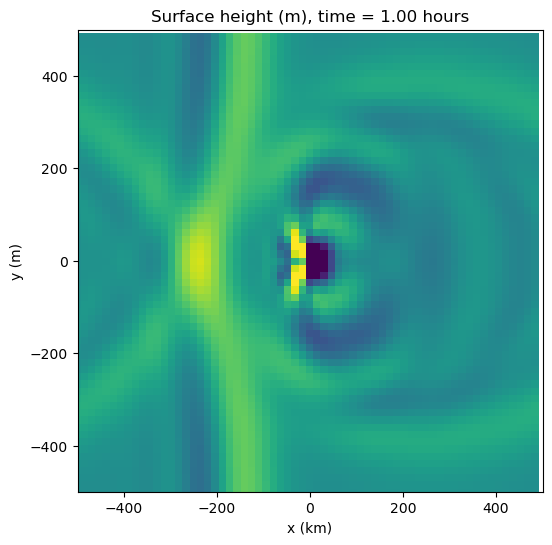

In [13]:
# create a figure and axes
fig = plt.figure(figsize=(6,6))

# Create arrays with the x and y coordinates for plotting using pcolor
from dedalus.extras import plot_tools
(X, Y) = plot_tools.quad_mesh(np.squeeze(x), np.squeeze(y))  

# Define an animation function
def drawframe(n):
    plt.clf # clear the figure before plotting the next frame
    height = plt.pcolor(X/(1*kilometer), Y/(1*kilometer), h_save[n,:,:].T, vmin=-1, vmax=1)
    # Specify the axis limits and labels
    plt.xlim((-Lx/2 / (1*kilometer),Lx/2 / (1*kilometer)))   
    plt.ylim((-Ly/2 / (1*kilometer),Ly/2 / (1*kilometer)))            
    plt.xlabel('x (km)')
    plt.ylabel('y (m)')
    plt.title('Surface height (m), time = {0:.2f} hours'.format(t_save[n]/(1*hour)))
    return (height,)

from matplotlib import animation
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, drawframe, frames=len(t_save), interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())

**ANSWER:** By increasing the reference ocean depth and decreasing the minimum depth above the seamount, we find that the speed decreases so substantially over the seamount that the increase in wave amplitude must now be accounted to balance the continuity equation. The sides of the wave that pass over the seamount come together in an arch, distort the crest, and "snap." These effects arise when the nonlinear terms of the shallow water equations become important, suggesting the linear theory no longer holds.

## 3. Shallow water equations on a sphere

Of course the Earth isn't a flat plane. A great strength of Dedalus is its flexibility to solve equations in various geometries. The script below solves the 2D shallow water equations on a spherical shell, where the azimuth and colatitude are the independent variables. The colatitude is the complementary angle to the latitude such that the colatitude is $0^\circ$ at the North Pole, $90^\circ$ at the Equator, and $180^\circ$ at the South Pole. The spherical geometry also allows us to take into account the Earth's rotation in a realistic way. In this part of the project, we will assume that the bottom of the ocean is flat and that the resting height of the ocean is a constant $H$.  

We will use Dedalus to solve the following equations:
$$ \partial_t \mathbf{u} + g \nabla h + 2 \Omega \hat{\mathbf{z}} \times \mathbf{u} = -\mathbf{u} \cdot \nabla \mathbf{u} $$
$$ \partial_t + H \nabla \cdot \mathbf{u} = -\nabla \cdot (h \mathbf{u}) $$

where $\mathbf{u}$ is the velocity vector, $\Omega$ is the Earth's angular velocity (in radians per second), and $\hat{\mathbf{z}}$ is a unit vector aligned with the North Pole. Note that we have written the equations above in vector form. Dedalus includes vector calculus operators that make it very natural to solve equations like this without worrying about the particular form of the vector operators in a curvilinear coordinate system.

### 3.1  Dedalus script for 2D shallow water equations on a sphere

In [14]:
# Import the required packages
import numpy as np
import dedalus.public as dedalus
import logging
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)

# Define the simulation units. This is optional, but will help us keep track of units
meter = 1
kilometer = meter * 1e3
second = 1
minute = 60
hour = 3600
day = hour * 24

# Parameters
Nphi = 128 # Number of gridpoints in phi (longitude)
Ntheta = 64 # Number of gridpoints in theta (colatitude)
R = 6.37122e3 * kilometer
Omega = 2 * np.pi / (1 * day) # Earth's angular velocity in radians per second
g = 9.80616 * meter / second**2 # Gravitational acceleration
H = 4 * kilometer # Depth of the ocean
width = 2*np.pi*10/360 # Width of the initial Gaussian in radians
phi0 = np.pi # Longitude of the initial Gaussian height perturbation in radians
theta0 = np.pi/4 # Colatitude of the initial Gaussian height perturbation in radians

timestep = 60 * second
stop_sim_time = 10 * day

# Bases
coords = dedalus.S2Coordinates('phi', 'theta')
dist = dedalus.Distributor(coords, dtype=np.float64)
basis = dedalus.SphereBasis(coords, (Nphi, Ntheta), radius=R, dealias=3/2, dtype=np.float64)

# Define the coordinates
phi, theta = dist.local_grids(basis) # Longitude and colatitude
lat = 360*(np.pi / 2 - theta)/(2*np.pi)  # latitude in degrees

# Fields
u = dist.VectorField(coords, name='u', bases=basis)
h = dist.Field(name='h', bases=basis)

# Operators
# First, create an operator to perform the cross product: "z x ", where z is the local vertical unit vector
# The "skew" operator performs a 90 degree rotation of a vector field,
# so that skew([u,v]) = [-v, u].  MulCosine multiplies by the cosine of the latitude
zcross = lambda A: dedalus.MulCosine(dedalus.skew(A))

# Set the initial conditions
h.change_scales(1) # Set values on regular grid
u.change_scales(1)
h['g'] = np.exp(-((phi-phi0)**2+(theta-theta0)**2)/width**2)  # Initialize the dependent variable c with a Gaussian function (note ** is the exponentiation operator)
# Set the initial velocity to zero
u['g'][0] = 0 # the x-component of the velocity
u['g'][1] = 0 # the y-component of the velocity

# Problem
problem = dedalus.IVP([u, h], namespace=locals())
problem.add_equation("dt(u) + g*grad(h) + 2*Omega*zcross(u) = - u@grad(u)")
problem.add_equation("dt(h) + H*div(u) = - div(h*u)")

# Solver
solver = problem.build_solver(dedalus.RK222)
solver.stop_sim_time = stop_sim_time

h.change_scales(1)
h_save = [np.copy(h['g'])]; t_save = [solver.sim_time]; # Save the initial condition and the initial time
# Main loop
try:
    logger.info('Starting main loop')
    while solver.proceed:
        solver.step(timestep)
        if (solver.iteration-1) % 10 == 0:
            logger.info('Iteration=%i, Time=%e, dt=%e' %(solver.iteration, solver.sim_time, timestep))
            h.change_scales(1)
            h_save.append(np.copy(h['g']))
            t_save.append(solver.sim_time)
except:
    logger.error('Exception raised, triggering end of main loop.')
    raise
finally:
    solver.log_stats()

h_save = np.array(h_save)

2025-11-26 14:53:12,511 subsystems 0/1 INFO :: Building subproblem matrices 1/63 (~2%) Elapsed: 0s, Remaining: 1s, Rate: 9.1e+01/s
2025-11-26 14:53:12,563 subsystems 0/1 INFO :: Building subproblem matrices 7/63 (~11%) Elapsed: 0s, Remaining: 1s, Rate: 1.1e+02/s
2025-11-26 14:53:12,623 subsystems 0/1 INFO :: Building subproblem matrices 14/63 (~22%) Elapsed: 0s, Remaining: 0s, Rate: 1.1e+02/s
2025-11-26 14:53:12,682 subsystems 0/1 INFO :: Building subproblem matrices 21/63 (~33%) Elapsed: 0s, Remaining: 0s, Rate: 1.2e+02/s
2025-11-26 14:53:12,741 subsystems 0/1 INFO :: Building subproblem matrices 28/63 (~44%) Elapsed: 0s, Remaining: 0s, Rate: 1.2e+02/s
2025-11-26 14:53:12,799 subsystems 0/1 INFO :: Building subproblem matrices 35/63 (~56%) Elapsed: 0s, Remaining: 0s, Rate: 1.2e+02/s
2025-11-26 14:53:12,855 subsystems 0/1 INFO :: Building subproblem matrices 42/63 (~67%) Elapsed: 0s, Remaining: 0s, Rate: 1.2e+02/s
2025-11-26 14:53:12,912 subsystems 0/1 INFO :: Building subproblem matri

### 3.2  Plotting
The code below will make a movie of the height as a function of x and y

2025-11-26 14:56:57,219 matplotlib.animation 0/1 INFO :: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2025-11-26 14:56:57,219 matplotlib.animation 0/1 INFO :: MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1200x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /var/folders/rp/zp_9g6fs2nz5lbnfxvt4jm0c0000gn/T/tmpf1_31ari/temp.m4v


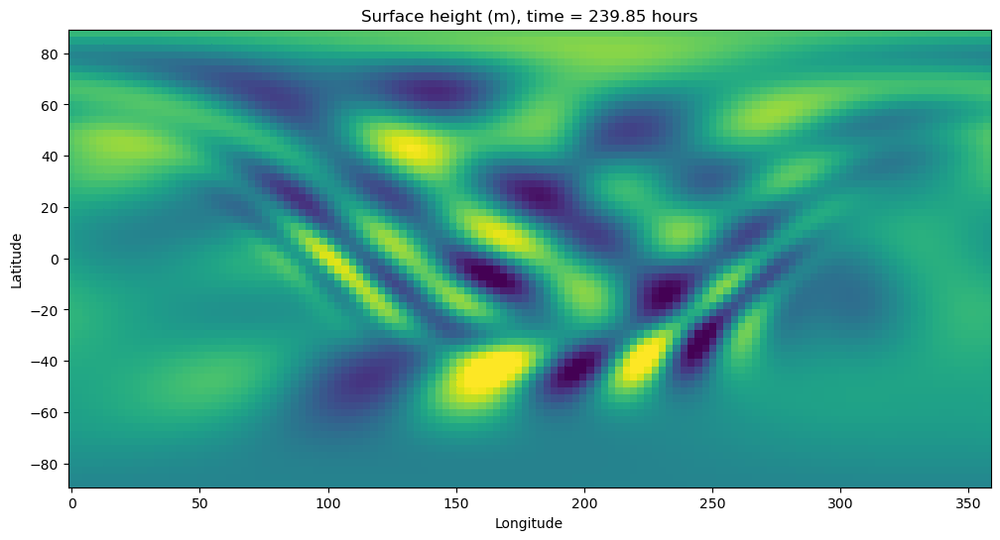

In [15]:
# create a figure and axes
fig = plt.figure(figsize=(12,6))

# Create arrays with the latitude and longitude coordinates for plotting using pcolor
from dedalus.extras import plot_tools
(X, Y) = plot_tools.quad_mesh(np.squeeze(np.pi/2 - theta)*360/2/np.pi, np.squeeze(phi)*360/2/np.pi)  

# Define an animation function
def drawframe(n):
    plt.clf()
    height = plt.pcolor(Y, X, h_save[n,:,:], vmin=-0.1, vmax=0.1)
    # Specify the axis limits and labels         
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Surface height (m), time = {0:.2f} hours'.format(t_save[n]/(1*hour)))
    return (height,)

from matplotlib import animation
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, drawframe, frames=len(t_save), interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())

### 3.3 Student investigation
<a id='section3pt3'></a>
Create a virtual tide gauge by sampling the height at a point at a latitude of 45ºN and longitude of 90ºW and plot the timeseries of the height at this point in the cells below. You should modifty the code to save the height more often so that you can clearly see the shape of the wave. Notice that as the waves propagate around the Earth, their shape changes. Discuss physical mechanisms that might cause the shape of the wave to change as the wave propagates.

Text(0.5, 1.0, 'Tidal Gauge at 45 North 90 West')

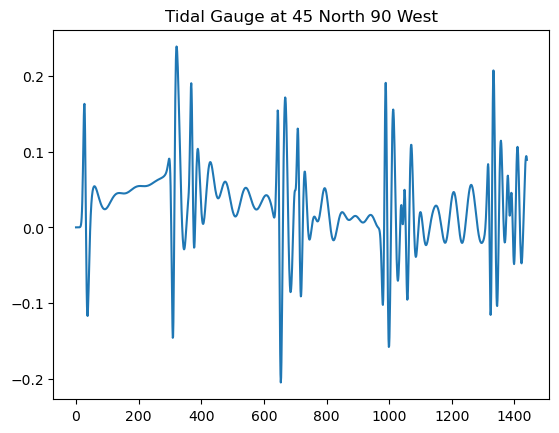

In [16]:
heights = []
for n in range(len(h_save[:, 0, 0])):
    height = h_save[n, 48, 48]
    heights.append(height)

plt.plot(heights)
plt.title("Tidal Gauge at 45 North 90 West")

**ANSWER:** As the tsunami waves propagate around Earth, the wave shape recorded by a fixed tide gauge changes due to several physical mechanisms. We can see from the above image that the wave energy does not travel as a single coherent front but rather there appears to be longwave packets that come into the tidal gauge with slightly different interior waves and different amplitudes. As the components wrap around the globe and interfere with each other, the gauge registers wave packets with varying amplitudes and internal oscillations, producing constructive and destructive interference patters. Additionally, Earth's rotation modifies the motion of the waves due to the coriolis effect. As the waves travel towards regions with higher coriolis effect (towards the equator), the wave packets distort. The coriolis effect combined with the differences in shape and amplitude explain the observed wave signal in the figure.

In the simulation above, the Tsunami wave travels around the planet many times. In reality, the waves will partially dissipate when they reach shorelines. In the spherical shallow water equation code above (or in a new code block below), add a forcing term to the shallow water equations that damps the waves for longitudes larger than $\pm 90^\circ$. Specifically, add a forcing function to the right hand side of the height equation of the following form:

$$ - (1/\tau) f(\phi) h$$

where

$$ f(\phi) = \frac{1}{2}\left(1+tanh\left(\frac{\phi-3\pi/2}{\pi/10}\right)\right) + \frac{1}{2}\left(1-tanh\left(\frac{\phi-\pi/2}{\pi/10}\right)\right) $$

and $\phi$ is the longitude in radians and $\tau$ is a damping timescale. A timescale of $\tau=0.1$ days should be sufficient to damp the waves.

With this damping term active, much more slowly propagating waves should be visible. These are shallow water Rossby waves. Estimate the east/west phase speed of these Rossby waves from the theoretical dispersion relation and compare this estimate with the phase speed that you can infer from the simulation by plotting the height, $h$, as a function of longitude and time. Discuss the spatial structure of the Rossby waves and any discrepancies that you see between your estimated and measured phase speeds.

In [17]:
# Import the required packages
import numpy as np
import dedalus.public as dedalus
import logging
import matplotlib.pyplot as plt

logger = logging.getLogger(__name__)

# Define the simulation units. This is optional, but will help us keep track of units
meter = 1
kilometer = meter * 1e3
second = 1
minute = 60
hour = 3600
day = hour * 24

# Parameters
Nphi = 128 # Number of gridpoints in phi (longitude)
Ntheta = 64 # Number of gridpoints in theta (colatitude)
R = 6.37122e3 * kilometer
Omega = 2 * np.pi / (1 * day) # Earth's angular velocity in radians per second
g = 9.80616 * meter / second**2 # Gravitational acceleration
H = 4 * kilometer # Depth of the ocean
width = 2*np.pi*10/360 # Width of the initial Gaussian in radians
phi0 = np.pi # Longitude of the initial Gaussian height perturbation in radians
theta0 = np.pi/4 # Colatitude of the initial Gaussian height perturbation in radians

# NEW PARAMETERS
tau_inverse = (0.1 * day) ** -1

timestep = 60 * second
stop_sim_time = 10 * day

# Bases
coords = dedalus.S2Coordinates('phi', 'theta')
dist = dedalus.Distributor(coords, dtype=np.float64)
basis = dedalus.SphereBasis(coords, (Nphi, Ntheta), radius=R, dealias=3/2, dtype=np.float64)

# Define the coordinates
phi, theta = dist.local_grids(basis) # Longitude and colatitude
lat = 360*(np.pi / 2 - theta)/(2*np.pi)  # latitude in degrees

# Fields
u = dist.VectorField(coords, name='u', bases=basis)
h = dist.Field(name='h', bases=basis)
f = dist.Field(name='f', bases=basis)

# Operators
# First, create an operator to perform the cross product: "z x ", where z is the local vertical unit vector
# The "skew" operator performs a 90 degree rotation of a vector field,
# so that skew([u,v]) = [-v, u].  MulCosine multiplies by the cosine of the latitude
zcross = lambda A: dedalus.MulCosine(dedalus.skew(A))

# Set the initial conditions
h.change_scales(1) # Set values on regular grid
u.change_scales(1)
h['g'] = np.exp(-((phi-phi0)**2+(theta-theta0)**2)/width**2)  # Initialize the dependent variable c with a Gaussian function (note ** is the exponentiation operator)
# Set the initial velocity to zero
u['g'][0] = 0 # the x-component of the velocity
u['g'][1] = 0 # the y-component of the velocity
f['g'] = (1/2) * (1 + np.tanh((phi - (3*np.pi/2))/(np.pi/10))) + (1/2) * (1 - np.tanh((phi - (np.pi/2))/(np.pi/10)))

# Problem
problem = dedalus.IVP([u, h], namespace=locals())
problem.add_equation("dt(u) + g*grad(h) + 2*Omega*zcross(u) = - u@grad(u)")
problem.add_equation("dt(h) + H*div(u) = - div(h*u) - tau_inverse*f*h")

# Solver
solver = problem.build_solver(dedalus.RK222)
solver.stop_sim_time = stop_sim_time

h.change_scales(1)
h_save = [np.copy(h['g'])]; t_save = [solver.sim_time]; # Save the initial condition and the initial time
# Main loop
try:
    logger.info('Starting main loop')
    while solver.proceed:
        solver.step(timestep)
        if (solver.iteration-1) % 10 == 0:
            logger.info('Iteration=%i, Time=%e, dt=%e' %(solver.iteration, solver.sim_time, timestep))
            h.change_scales(1)
            h_save.append(np.copy(h['g']))
            t_save.append(solver.sim_time)
except:
    logger.error('Exception raised, triggering end of main loop.')
    raise
finally:
    solver.log_stats()

h_save = np.array(h_save)

2025-11-26 14:59:09,765 subsystems 0/1 INFO :: Building subproblem matrices 1/63 (~2%) Elapsed: 0s, Remaining: 0s, Rate: 1.4e+02/s
2025-11-26 14:59:09,796 subsystems 0/1 INFO :: Building subproblem matrices 7/63 (~11%) Elapsed: 0s, Remaining: 0s, Rate: 1.8e+02/s
2025-11-26 14:59:09,832 subsystems 0/1 INFO :: Building subproblem matrices 14/63 (~22%) Elapsed: 0s, Remaining: 0s, Rate: 1.9e+02/s
2025-11-26 14:59:09,868 subsystems 0/1 INFO :: Building subproblem matrices 21/63 (~33%) Elapsed: 0s, Remaining: 0s, Rate: 1.9e+02/s
2025-11-26 14:59:09,907 subsystems 0/1 INFO :: Building subproblem matrices 28/63 (~44%) Elapsed: 0s, Remaining: 0s, Rate: 1.9e+02/s
2025-11-26 14:59:09,944 subsystems 0/1 INFO :: Building subproblem matrices 35/63 (~56%) Elapsed: 0s, Remaining: 0s, Rate: 1.9e+02/s
2025-11-26 14:59:09,982 subsystems 0/1 INFO :: Building subproblem matrices 42/63 (~67%) Elapsed: 0s, Remaining: 0s, Rate: 1.9e+02/s
2025-11-26 14:59:10,021 subsystems 0/1 INFO :: Building subproblem matri

2025-11-26 15:03:21,957 matplotlib.animation 0/1 INFO :: Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2025-11-26 15:03:21,958 matplotlib.animation 0/1 INFO :: MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 1200x600 -pix_fmt rgba -framerate 25.0 -i pipe: -vcodec h264 -pix_fmt yuv420p -y /var/folders/rp/zp_9g6fs2nz5lbnfxvt4jm0c0000gn/T/tmps7y37jxh/temp.m4v


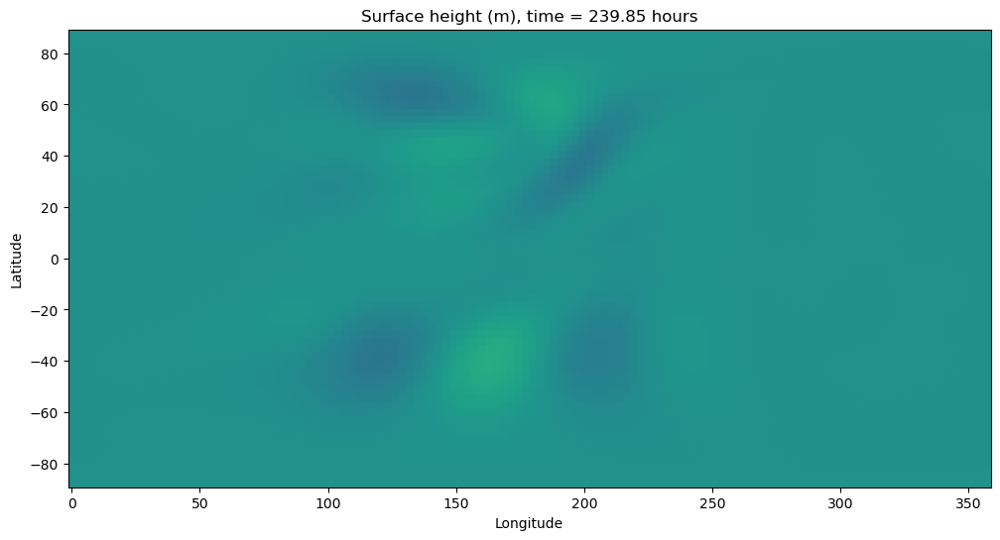

In [18]:
# create a figure and axes
fig = plt.figure(figsize=(12,6))

# Create arrays with the latitude and longitude coordinates for plotting using pcolor
from dedalus.extras import plot_tools
(X, Y) = plot_tools.quad_mesh(np.squeeze(np.pi/2 - theta)*360/2/np.pi, np.squeeze(phi)*360/2/np.pi)  

# Define an animation function
def drawframe(n):
    plt.clf()
    height = plt.pcolor(Y, X, h_save[n,:,:], vmin=-0.1, vmax=0.1)
    # Specify the axis limits and labels         
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Surface height (m), time = {0:.2f} hours'.format(t_save[n]/(1*hour)))
    return (height,)

from matplotlib import animation
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, drawframe, frames=len(t_save), interval=40, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())

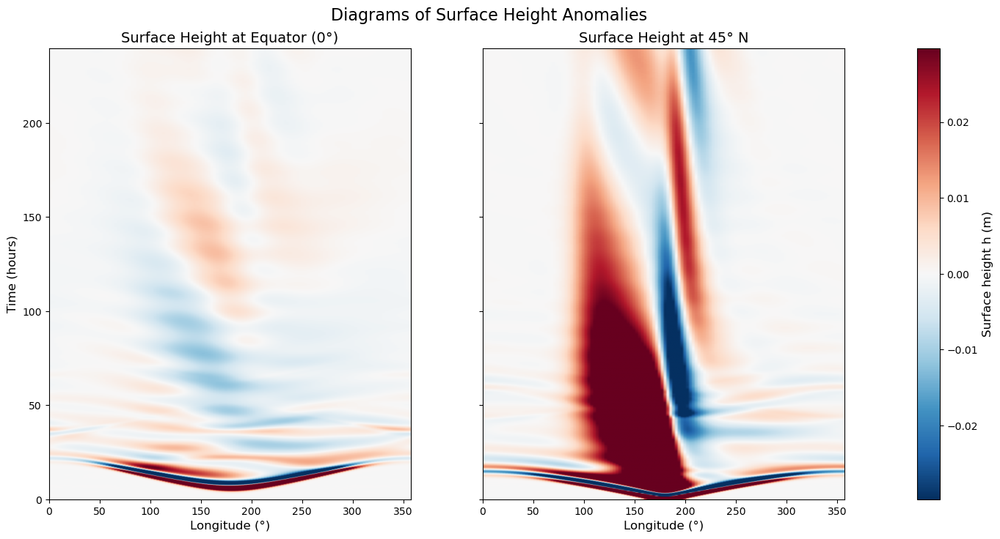

In [19]:
lat_deg = (np.pi/2 - np.squeeze(theta)) * 180/np.pi 
lon_deg = (np.squeeze(phi)) * 180/np.pi                

t_hours = np.array(t_save) / 3600.0
order   = np.argsort(lon_deg)
lon_sorted = lon_deg[order]

H_eq  = h_save[:, :, 32][:, order]   # Equator
H_45N = h_save[:, :, 48][:, order]   # 45°N

vmax = np.nanpercentile(np.abs([H_eq, H_45N]), 95)
vmin = -vmax

fig, axs = plt.subplots(1, 2, figsize=(16, 8), sharey=True)
cmap = plt.get_cmap("RdBu_r")

im0 = axs[0].imshow(H_eq,
                    extent=[lon_sorted[0], lon_sorted[-1], t_hours[0], t_hours[-1]],
                    origin='lower', aspect='auto', cmap=cmap, vmin=vmin, vmax=vmax)
axs[0].set_title('Surface Height at Equator (0°)', fontsize=14)
axs[0].set_xlabel('Longitude (°)', fontsize=12)
axs[0].set_ylabel('Time (hours)', fontsize=12)

im1 = axs[1].imshow(H_45N,
                    extent=[lon_sorted[0], lon_sorted[-1], t_hours[0], t_hours[-1]],
                    origin='lower', aspect='auto', cmap=cmap, vmin=vmin, vmax=vmax)
axs[1].set_title('Surface Height at 45° N', fontsize=14)
axs[1].set_xlabel('Longitude (°)', fontsize=12)

cbar = fig.colorbar(im1, ax=axs.ravel().tolist(), location='right',
                    fraction=0.046, pad=0.08)
cbar.set_label('Surface height h (m)', fontsize=12)

fig.suptitle('Diagrams of Surface Height Anomalies', fontsize=16, y=0.95)

plt.show()

**ANSWER:** By visual inspection, we assert that the Rossby waves move approximately 50 degrees in longitude in around 50 hours at the equator. Likewise, we assert that the Rossby waves move at approximately 20 degrees in longitude in around 50 hours at 45 degrees north. By using the following link (https://www.nhc.noaa.gov/gccalc.shtml) we calculate the equatorial movement is 5556 km in 50 hours. This is equivalent to a velocity of approximately 30 meters per second. Likewise, at 45 degrees north, a 20 degree longitudinal movement corresponds to a displacement of 1567 km in 50 hours. This corresponds to a velocity of approximately 9 meters per seconds. 

From lecture 13 of FEM, we know that $\omega$ is $\frac{-\beta k_1}{(k_1^2 + k_2^2)}.$ Hence the phase velocity is $\vec{c}_p = \frac{-\beta k_1}{(k_1^2 + k_2^2)^2} (k_1, k_2)$ In this case, we are only looking at one direction so $c_{p,x} = \frac{-\beta}{k_1^2}$ where $k_1 = \frac{m}{R_e \cos \theta}$ where $m$ is the number of wavelengths that exist across the longitudes at a given time and the radius of the Earth ($R_e$) is approximately 6300 kilometers. $\beta$ is the change in the Coriolis parameter with respect to the latitude and is equal to $\frac{2\Omega \cos \theta}{R_e}$ where $\Omega$ is the angular velocity of the Earth. Thus, by choosing $m=3$ from visual inspection the phase velocity at the equator is $c_p = \frac{2 (7.29 \times 10^{-5} rad/s) 6.3 \times 10^6}{3^2} \approx 100$ meters per second. By repeating the calculation at 45 degrees North with $m = 6$ from visual inspection (at t = 75 hours), we have a phase velocity of about 10 meters per second. The phase velocity at the midlatitude matches well with theory but not at the equator. This could be because the coriolis effect is maximized at the equator and thus the "small beta" approximation may not necessarily hold well.

## 4. Optional further investigations

* In the example of the shallow water equations on a sphere, introduce bathymetry by making $H$ a function of latitude and longitude. Make sure that you modify the equations in Dedalus appropriately. How do the waves behave when they encounter shallow water (e.g. a localized seamount)?

* It is quite difficult to simulate changing sea level (sometimes called wetting and drying), which is why the examples above do not include land. However, we can estimate the distance that a Tsunami will propagate using physical and dimensional arguments. Consider, for example, a flat, sloping beach. In the absence of energy dissipation, estimate the distance that a wave will propagate onshore. How could you modify this estimate to include energy dissipation (or drag)?